In [1]:
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as vis_util
import numpy as np

import os
import six.moves.urllib as urllib
import sys
import tarfile
import tensorflow as tf
import zipfile

from collections import defaultdict
from io import StringIO
from matplotlib import pyplot as plt
from PIL import Image

%matplotlib inline

In [2]:
def updt(total, progress, info):
    
    """
    Show how a loop progress


    Parameters
    ----------
    total : int 
    maximum of the loop
    
    progress : int 
    the iterator
    
    info : string
    name of the loading bar

    Returns
    -------
    a loading bar
    """
    
    progress=progress+1
    barLength, status = 20, ""
    progress = float(progress) / float(total)
    if progress >= 1.:
        progress, status = 1, "\r\n"
    block = int(round(barLength * progress))
    text = "\r\n[{}] {:.0f}%, filename {}                    ".format(
        "#" * block + "-" * (barLength - block), round(progress * 100, 0),
        status)
    sys.stdout.write(text + info)
    sys.stdout.flush()

In [3]:
# Path to frozen detection graph. This is the actual model that is used for the object detection.
PATH_TO_CKPT = '../monoblocModels/v2-1/frozen_inference_graph.pb'

# List of the strings that is used to add correct label for each box.
PATH_TO_LABELS = 'monoblocModel/monobloc_label_map.pbtxt'

#json that our model will need to import test data
PATH_TO_TEST_DIR = 'new_test/'

print(PATH_TO_LABELS)
print(PATH_TO_CKPT)
print(PATH_TO_TEST_DIR)

NUM_CLASSES = 1


monoblocModel/monobloc_label_map.pbtxt
../monoblocModels/v2-1/frozen_inference_graph.pb


In [4]:
detection_graph = tf.Graph()
with detection_graph.as_default():
    od_graph_def = tf.GraphDef()
    with tf.gfile.GFile(PATH_TO_CKPT, 'rb') as fid:
        serialized_graph = fid.read()
        od_graph_def.ParseFromString(serialized_graph)
        tf.import_graph_def(od_graph_def, name='')

In [5]:
label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
categories = label_map_util.convert_label_map_to_categories(label_map, max_num_classes=NUM_CLASSES, use_display_name=True)
category_index = label_map_util.create_category_index(categories)
print(label_map)


item {
  name: "monobloc chair"
  id: 1
}



In [6]:
#Fonction afin de stockés tous les chemins vers une image dans un dossier commun

def ReadPaths(dname):
    good_paths = []
    files=os.listdir(dname)
    
    for file in files:
        if file.endswith('.jpg'):
            file=dname+file
            good_paths.append(file)
    return good_paths


image_paths = ReadPaths(PATH_TO_TEST_DIR)

print(image_paths)


['new_test/14715242.jpg', 'new_test/14776079356_d2889860d1.jpg', 'new_test/15218310266_d53f2aa21a.jpg', 'new_test/18077581195_43095f1626.jpg', 'new_test/183cace0b844eeda434770f4e045d97a--mirrors.jpg', 'new_test/220px-Toilettes_mg_3872b.jpg', 'new_test/29717675_166533044057810_5238926388114751488_n.jpg', 'new_test/37365659346_b6d71f9871.jpg', 'new_test/39107417855_e6b8f4aa76.jpg', 'new_test/4c962d600cdfa220460b524cf6c0aa8f--old-chairs-chair-design.jpg', 'new_test/4_Pieds_Viry_Chatillon.jpg', 'new_test/51655838d9e99c1fae8cf73e5ecb58ac.jpg', 'new_test/992732802408_1.jpg', 'new_test/aaa7842535b9f623910acf7493fbb718.jpg', 'new_test/bvcxdgfhgyjkn,.jpg', 'new_test/C3BbO0gWgAIX1kk.jpg', 'new_test/chaise-de-bureau-pivotante-inspirant-chaise-bureau-turquoise-hauteur-de-bureau-awesome-fresh-media-cache-of-chaise-de-bureau-pivotante.jpg', 'new_test/CHAISE-UTAH-MOBLIbis.jpg', 'new_test/chaises-salle-manger-capitonnees-new-fauteuil-salle-manger-design-2-avec-chaises-de-pas-cher-achat-et-of-chaises-s

In [7]:
def load_image_into_numpy_array(image):
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)


# Size, in inches, of the output images.
IMAGE_SIZE = (12, 8)

In [8]:
def print_tagged_images(image_paths,IMAGE_SIZE=(12, 8)):
    with detection_graph.as_default():
        with tf.Session(graph=detection_graph) as sess:
            # Definite input and output Tensors for detection_graph
            image_tensor = detection_graph.get_tensor_by_name('image_tensor:0')
            # Each box represents a part of the image where a particular object was detected.
            detection_boxes = detection_graph.get_tensor_by_name('detection_boxes:0')
            # Each score represent how level of confidence for each of the objects.
            # Score is shown on the result image, together with the class label.
            detection_scores = detection_graph.get_tensor_by_name('detection_scores:0')
            detection_classes = detection_graph.get_tensor_by_name('detection_classes:0')
            num_detections = detection_graph.get_tensor_by_name('num_detections:0')
            
            id_image=1
            for image_path in image_paths:
                image = Image.open(image_path)
                # the array based representation of the image will be used later in order to prepare the
                # result image with boxes and labels on it.
                image_np = load_image_into_numpy_array(image)
                # Expand dimensions since the model expects images to have shape: [1, None, None, 3]
                image_np_expanded = np.expand_dims(image_np, axis=0)
                # Actual detection.
                (boxes, scores, classes, num) = sess.run([detection_boxes, 
                                                          detection_scores, 
                                                          detection_classes, 
                                                          num_detections],feed_dict={image_tensor: image_np_expanded})
                # Visualization of the results of a detection.
                vis_util.visualize_boxes_and_labels_on_image_array(image_np,
                                                                   np.squeeze(boxes),
                                                                   np.squeeze(classes).astype(np.int32),
                                                                   np.squeeze(scores),
                                                                   category_index,
                                                                   min_score_thresh=.2,
                                                                   use_normalized_coordinates=True,
                                                                   line_thickness=3)
                plt.figure(figsize=IMAGE_SIZE)
                plt.imshow(image_np)
                
                id_score=1
                for score in scores[0]: #scores =[ [score classe 0] [score classe 1 ] etc... ]
                    if (score>0.2):
                        print("image numéro {}, score n°{} : {}".format(id_image, id_score,score))
                        id_score +=1
                id_image+=1

In [9]:
#Just to choose a limit of images to print if we have too many images in selected folder

def chooseNbPict(image_paths,nb):
    paths_chosen = []
    
    indices = np.arange(len(image_paths))
    np.random.shuffle(indices)

    count=0
    
    for path in image_paths:
        if (indices[count]<nb):
            paths_chosen.append(path)
        count+=1
    
    return paths_chosen

image numéro 2, score n°1 : 0.9985597729682922
image numéro 2, score n°2 : 0.9964189529418945
image numéro 3, score n°1 : 0.49887919425964355
image numéro 3, score n°2 : 0.36655980348587036
image numéro 4, score n°1 : 0.9996142387390137
image numéro 5, score n°1 : 0.9997312426567078
image numéro 7, score n°1 : 0.9998425245285034
image numéro 10, score n°1 : 0.9980681538581848
image numéro 12, score n°1 : 0.9972770810127258
image numéro 12, score n°2 : 0.9119633436203003
image numéro 16, score n°1 : 0.9995274543762207
image numéro 16, score n°2 : 0.9949288368225098
image numéro 16, score n°3 : 0.5066814422607422
image numéro 16, score n°4 : 0.21690717339515686
image numéro 17, score n°1 : 0.9012986421585083
image numéro 18, score n°1 : 0.961601197719574
image numéro 18, score n°2 : 0.9282501935958862
image numéro 18, score n°3 : 0.8493560552597046
image numéro 18, score n°4 : 0.45475366711616516
image numéro 19, score n°1 : 0.9787483215332031
image numéro 19, score n°2 : 0.8838544487953

/usr/local/lib/python3.5/dist-packages/matplotlib/pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


image numéro 29, score n°1 : 0.2073652148246765
image numéro 30, score n°1 : 0.39573901891708374
image numéro 31, score n°1 : 0.9999372959136963
image numéro 32, score n°1 : 0.9965295195579529
image numéro 33, score n°1 : 0.9263689517974854
image numéro 33, score n°2 : 0.33305951952934265
image numéro 34, score n°1 : 0.9997091889381409
image numéro 34, score n°2 : 0.9126618504524231
image numéro 35, score n°1 : 0.9997836947441101
image numéro 35, score n°2 : 0.9988088607788086
image numéro 35, score n°3 : 0.9983323216438293
image numéro 35, score n°4 : 0.9975106716156006
image numéro 35, score n°5 : 0.9936205744743347
image numéro 37, score n°1 : 0.9900778532028198
image numéro 39, score n°1 : 0.9704155921936035
image numéro 39, score n°2 : 0.3439980149269104
image numéro 43, score n°1 : 0.9779411554336548
image numéro 43, score n°2 : 0.3029954731464386
image numéro 44, score n°1 : 0.3101976215839386
image numéro 44, score n°2 : 0.2571311891078949
image numéro 45, score n°1 : 0.3112465

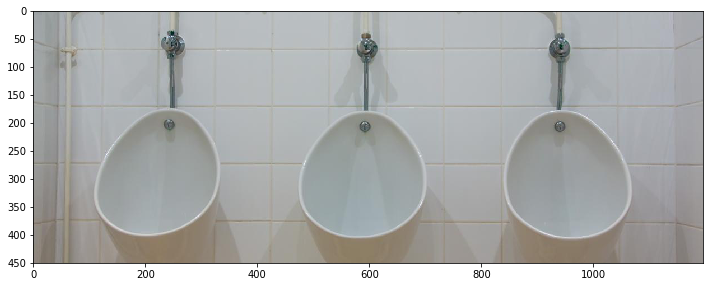

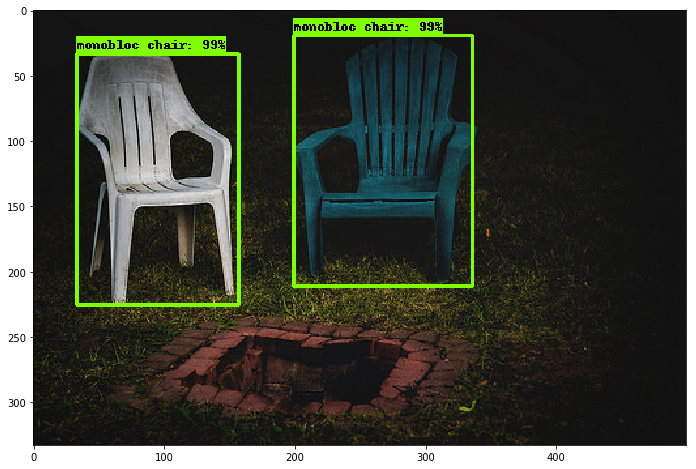

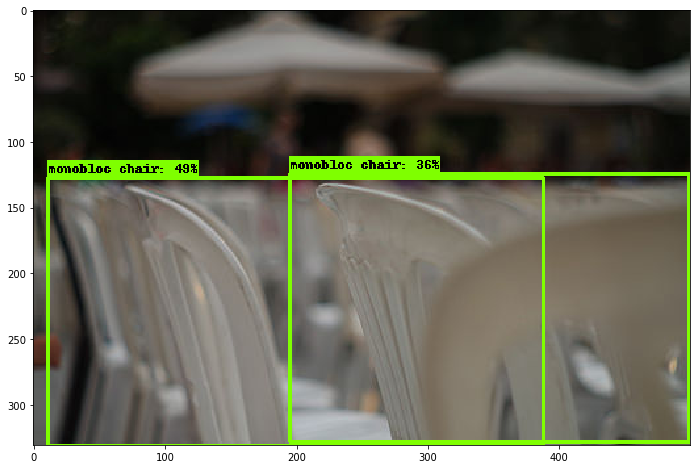

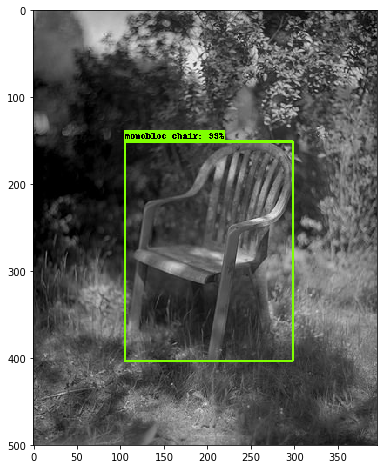

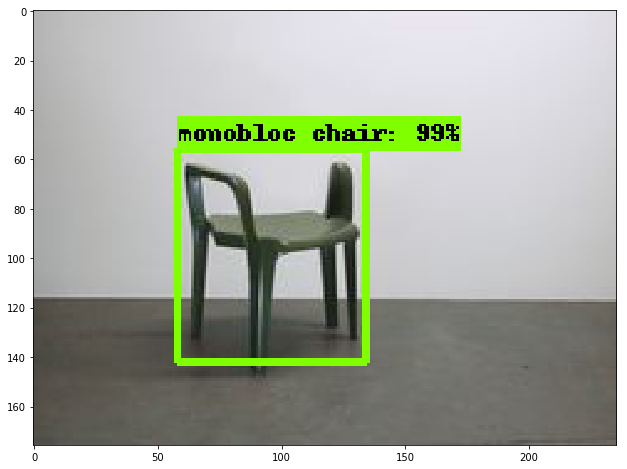

...

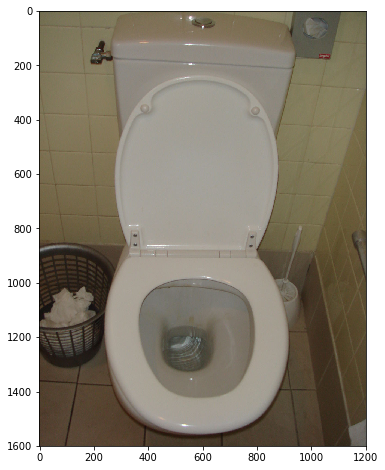

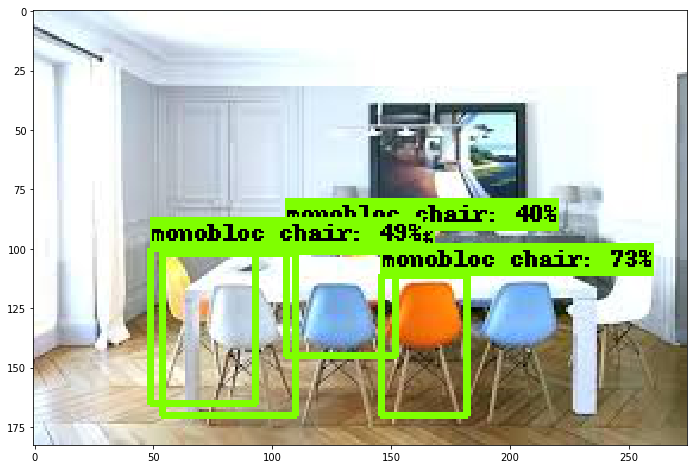

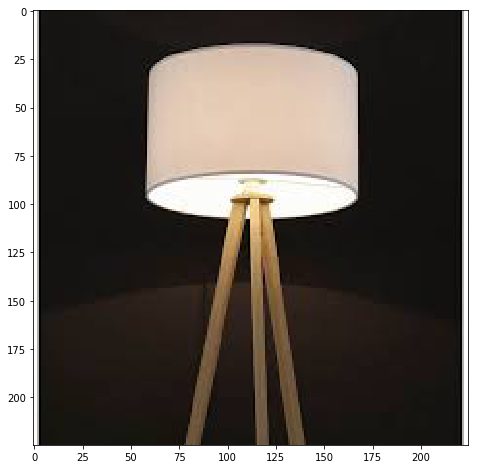

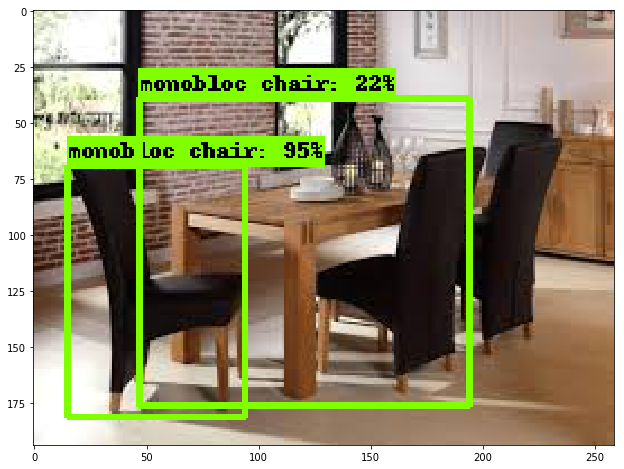

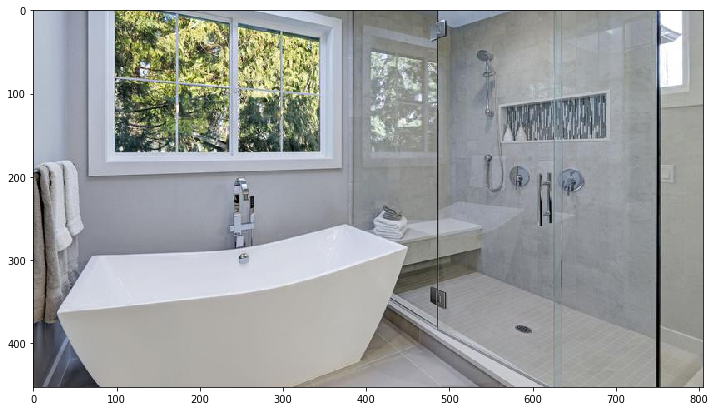

In [10]:
image_paths = ReadPaths(PATH_TO_TEST_DIR)
image_paths = chooseNbPict(image_paths,100)

print_tagged_images(image_paths)
